In [1]:
import sys 

import numpy as np
import pandas as pd
import anndata
from copy import copy
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path
import scanpy as sc
from scipy.sparse import hstack

sys.path.extend(["../../..", "."])
from paths import DATA_DIR

### Utils

In [2]:
def normalize_per_group(adata, obs_key):
    adata_tmp = adata.copy()
    obs_cat = np.unique(adata_tmp.obs[obs_key])
    for obs in obs_cat:
        print(f"Normalize category: {obs}")
        X_norm = sc.pp.normalize_total(adata_tmp[adata_tmp.obs[obs_key]==obs, :], inplace=False)["X"] 
        adata_tmp[adata_tmp.obs[obs_key]==obs].X = X_norm                                                                                    
    return adata_tmp

Read the data 

In [3]:
folder = DATA_DIR / "rawdata" / "unperturbed_time_course_processed"

In [4]:
folder

PosixPath('/nfs/homedirs/pala/PerturbSeq_CMV/data/rawdata/unperturbed_time_course_processed')

In [5]:
adata_genesxcells = sc.read_mtx(folder / "matrix.mtx")

Transpose to have cell x genes

In [6]:
adata = anndata.AnnData(adata_genesxcells.X.T)
adata.X.todense()

matrix([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 1., 7.],
        [0., 0., 0., ..., 0., 0., 3.]], dtype=float32)

The matrix is unnormalized

**Get the information on cells, barcodes and genes**

Read metadata associated to the AnnData 

In [7]:
barcode_path = folder / "barcodes.tsv"
cellidentity_path = folder / "cell_identities.csv"
genes_path = folder /"genes.tsv"

In [8]:
barcodes = pd.read_csv(barcode_path, sep="\t", header=None)
cellidentity = pd.read_csv(cellidentity_path)
genes = pd.read_csv(genes_path, sep="\t", header=None)

In [9]:
cellidentity

,cell_barcode,guide_identity,read_count,UMI_count,coverage,gemgroup,good_coverage,number_of_cells
0,CGATTGACAGCGAACA-2,GFP_pBA571-59,29624,396,74.808081,2,True,1
1,AAACGGGTCGTCACGG-2,GFP_pBA571-59,27369,368,74.372283,2,True,1
2,GCGCAACCACATTCGA-2,GFP_pBA571-59,26865,342,78.552632,2,True,1
3,GCTGCGAAGAGGTACC-2,GFP_pBA571-58,26823,423,63.411348,2,True,1
4,TACTCATGTCAGAATA-2,GFP_pBA571-59,25175,349,72.134670,2,True,1
...,...,...,...,...,...,...,...,...
14502,GCCTCTAGTTCCCGAG-1,*,1,1,1.000000,1,False,0
14503,GGAAAGCTCGTGGACC-2,*,1,1,1.000000,2,False,0
14504,GGGACCTGTAGCTTGT-1,*,1,1,1.000000,1,False,0
14505,GGTGTTAGTCTACCTC-1,*,1,1,1.000000,1,False,0


In [10]:
genes.columns = ["ENSMBL", "gene ID"]

**Read metadata**

In [11]:
metadata = pd.read_excel(folder / "unperturbed_time_course_processed.xlsx")

In [12]:
metadata

,cell_barcode,gem_group,UMI_count,guide_UMI_count,guide_read_count,guide_coverage,MOI,experimental_time,cell_cycle_phase,viral_load,interferon_score,cluster,UMAP_1,UMAP_2
0,AAACCTGAGCGTAGTG-1,1,13247,29,1573,54.24,low,028h,M-G1,0.008908,1.815345,bystander,-3.302532,-0.172898
1,AAACCTGAGGCTAGAC-1,1,14094,12,487,40.58,low,096h,G2-M,0.671137,-1.316287,infected_6,-1.101087,11.574987
2,AAACCTGCACGGTAGA-1,1,16487,73,3266,44.74,low,028h,S,0.012373,1.377850,bystander,-1.994823,0.308592
3,AAACCTGCAGGTCCAC-1,1,12119,61,3859,63.26,low,048h,G1-S,0.011965,0.612030,bystander,-1.700732,1.202923
4,AAACCTGGTGGCCCTA-1,1,23214,56,2714,48.46,low,072h,G2-M,0.007625,0.733405,bystander,-1.540104,1.291726
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12914,TTTGTCATCATTGCGA-2,2,17438,34,1848,54.35,high,072h,M-G1,0.124326,-0.022159,infected_2,4.589217,-0.501372
12915,TTTGTCATCCCAAGTA-2,2,20186,69,5235,75.87,high,048h,S,0.035123,-1.130894,infected_2,6.416167,-3.043289
12916,TTTGTCATCCCACTTG-2,2,30703,66,4618,69.97,high,048h,G1-S,0.036153,-0.488409,infected_2,6.270998,-3.114618
12917,TTTGTCATCGTCACGG-2,2,58488,47,2754,58.60,high,048h,S,0.445698,-1.110313,infected_5,1.711608,10.221025


Keep only cells that appear in the spreadsheet from the supplementary materials

In [13]:
cells_to_keep = barcodes.loc[barcodes.isin(np.array(metadata.cell_barcode))[0]]
# Get indexes
cells_to_keep_idx = np.array(cells_to_keep.index)

Keep only the cells that appear both in the metadata and cellidentity matrix

In [14]:
adata = adata[cells_to_keep_idx,:]

Transform time from string to float in metadata 

In [15]:
metadata.experimental_time = [float(time.split("h")[0]) for time in metadata.experimental_time]

Fix the observations

In [16]:
adata.obs = metadata

Fix the vars

In [17]:
adata.var = pd.DataFrame(genes)
adata.var.index = adata.var["gene ID"]

In [18]:
adata.var["mt"] = adata.var_names.str.startswith("MT-") 

Define host and pathogen genes 

In [19]:
is_host = np.where(adata.var["ENSMBL"].str.startswith("ENSG"), True, False)
adata.var["is_host"]=is_host

**Pre-processing**

Highlight genes with more than 10000 transcripts (from the paper)

In [20]:
highly_expressed_genes = np.array((adata.X.todense().sum(0)>10000).astype(bool)).squeeze(0)
print(f"Number of genes with more than 10k counts: {np.sum(highly_expressed_genes)}")

Number of genes with more than 10k counts: 3588


In [21]:
adata.var["highly_variable"] = highly_expressed_genes

In [22]:
adata = adata[:, ~adata.var.index.duplicated(keep='first')]

In [23]:
adata

View of AnnData object with n_obs × n_vars = 12919 × 34023
    obs: 'cell_barcode', 'gem_group', 'UMI_count', 'guide_UMI_count', 'guide_read_count', 'guide_coverage', 'MOI', 'experimental_time', 'cell_cycle_phase', 'viral_load', 'interferon_score', 'cluster', 'UMAP_1', 'UMAP_2'
    var: 'ENSMBL', 'gene ID', 'mt', 'is_host', 'highly_variable'

**Subset to high MOIs**

In [24]:
adata = adata[adata.obs["MOI"]=="high", :]
adata.obs = adata.obs.reset_index()

/nfs/homedirs/pala/miniconda3/envs/PerturbSeq_CMV/lib/python3.9/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


**Separate the anndata**

In [25]:
adata_host = adata[:, adata.var.is_host]
adata_viral = adata[:, ~adata.var.is_host]

**Analyze host data**

In [26]:
sc.pp.normalize_total(adata_host)
sc.pp.log1p(adata_host)

/nfs/homedirs/pala/miniconda3/envs/PerturbSeq_CMV/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/nfs/homedirs/pala/miniconda3/envs/PerturbSeq_CMV/lib/python3.9/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [27]:
sc.tl.pca(adata_host, svd_solver="arpack", use_highly_variable=True)

In [28]:
sc.pp.neighbors(adata_host, n_pcs=30)

In [29]:
sc.tl.umap(adata_host)

/nfs/homedirs/pala/miniconda3/envs/PerturbSeq_CMV/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/homedirs/pala/miniconda3/envs/PerturbSeq_CMV/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/homedirs/pala/miniconda3/envs/PerturbSeq_CMV/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


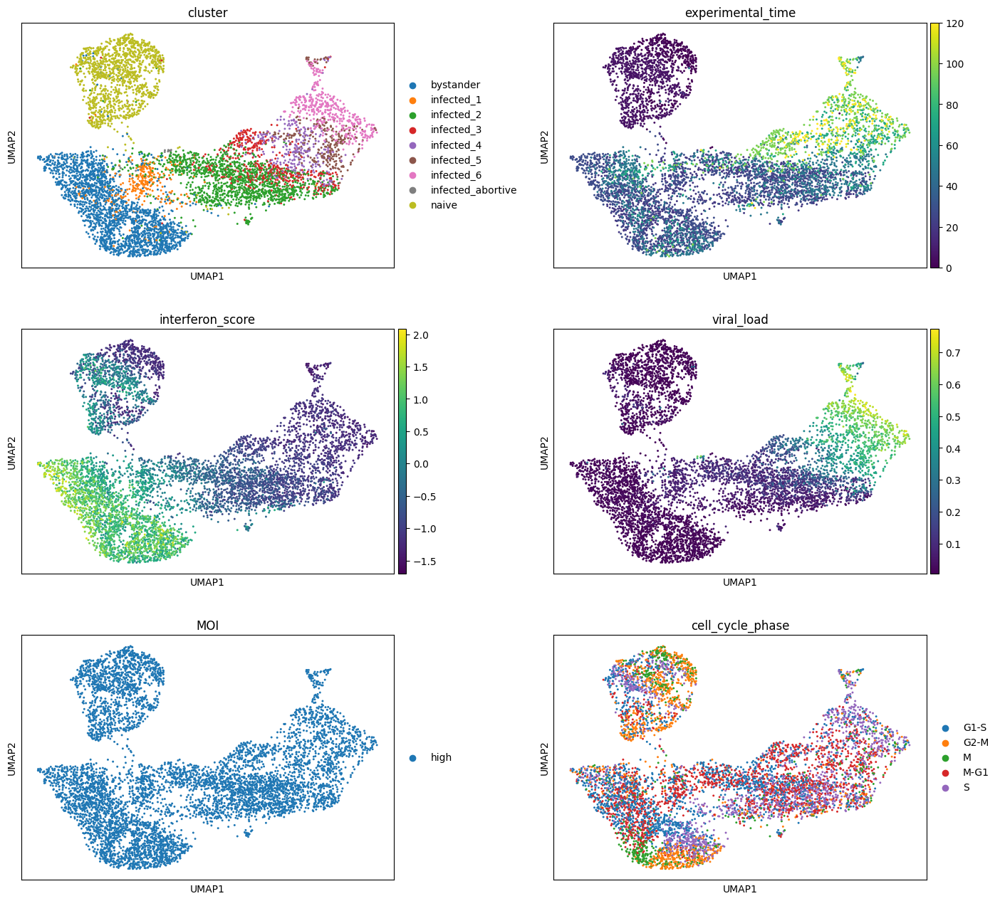

In [30]:
sc.pl.umap(adata_host, color=["cluster", "experimental_time", "interferon_score", "viral_load", "MOI", "cell_cycle_phase"], ncols=2, wspace=0.3)

/nfs/homedirs/pala/miniconda3/envs/PerturbSeq_CMV/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


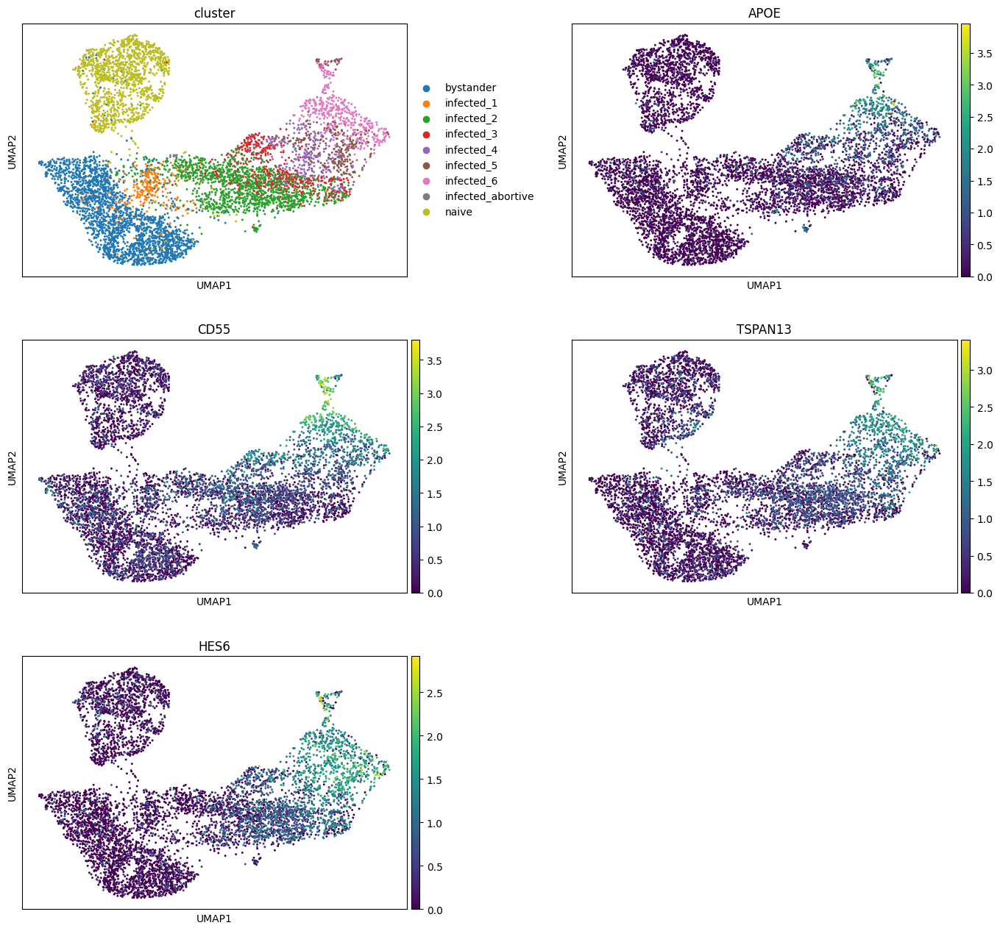

In [31]:
sc.pl.umap(adata_host, color=["cluster", "APOE", "CD55", "TSPAN13", "HES6"], ncols=2, wspace=0.3)

/nfs/homedirs/pala/miniconda3/envs/PerturbSeq_CMV/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


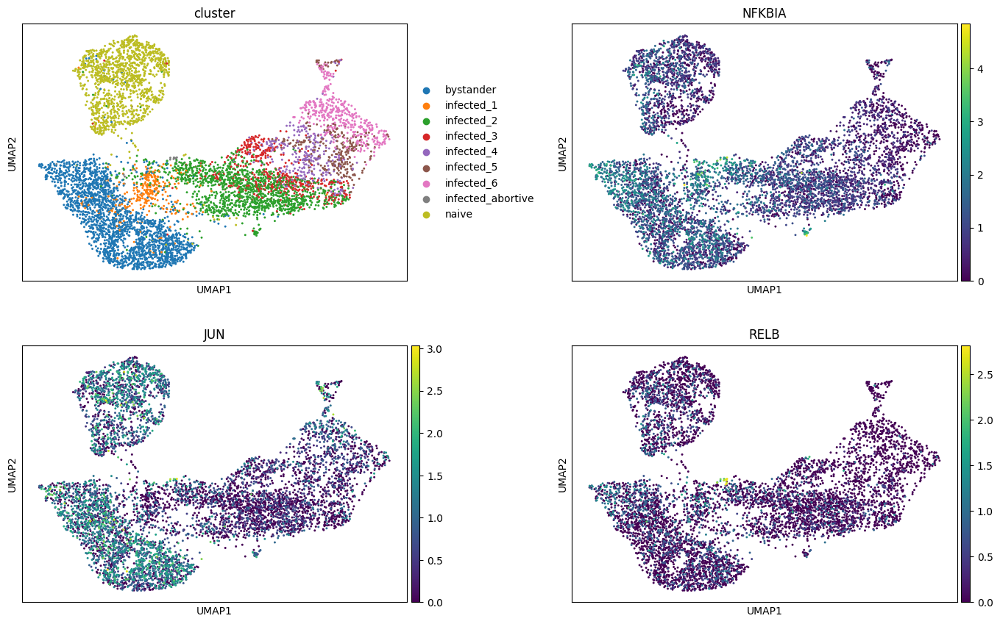

In [32]:
sc.pl.umap(adata_host, color=["cluster", "NFKBIA", "JUN", "RELB"], ncols=2, wspace=0.3)

/nfs/homedirs/pala/miniconda3/envs/PerturbSeq_CMV/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


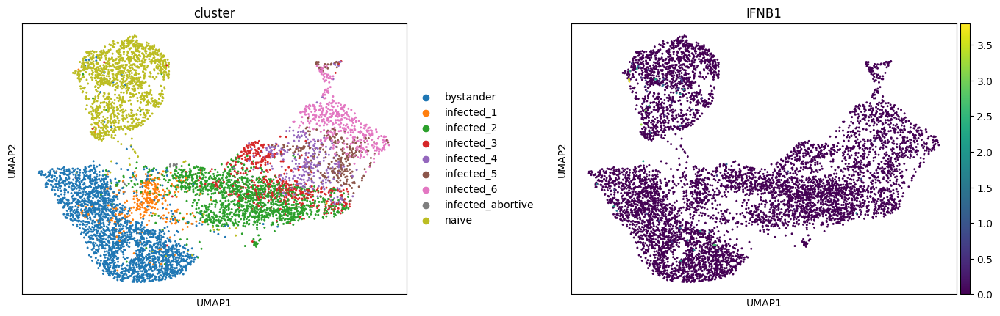

In [33]:
sc.pl.umap(adata_host, color=["cluster", "IFNB1"], ncols=2, wspace=0.3)

**Analyze viral data**

In [34]:
sc.pp.log1p(adata_viral)

/nfs/homedirs/pala/miniconda3/envs/PerturbSeq_CMV/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/nfs/homedirs/pala/miniconda3/envs/PerturbSeq_CMV/lib/python3.9/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [35]:
sc.tl.pca(adata_viral, svd_solver="arpack", use_highly_variable=True)

In [36]:
sc.pp.neighbors(adata_viral, n_pcs=30)

In [37]:
sc.tl.umap(adata_viral)

/nfs/homedirs/pala/miniconda3/envs/PerturbSeq_CMV/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/homedirs/pala/miniconda3/envs/PerturbSeq_CMV/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/homedirs/pala/miniconda3/envs/PerturbSeq_CMV/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


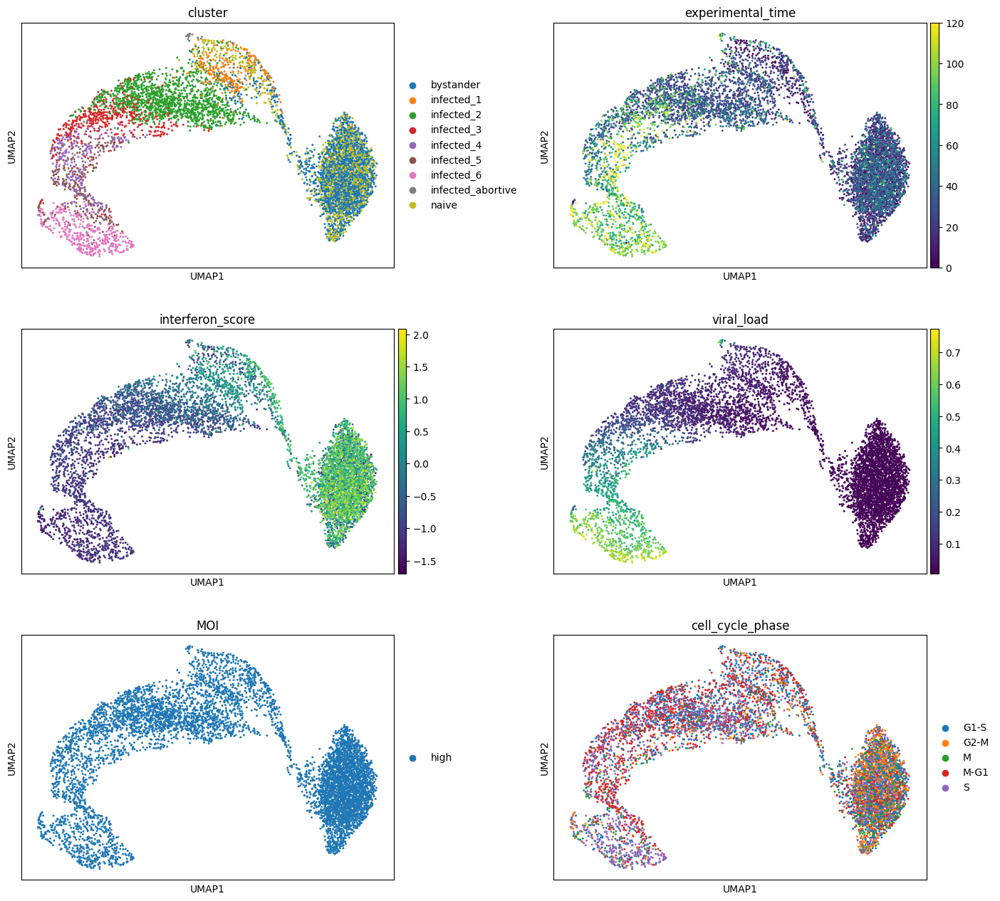

In [38]:
sc.pl.umap(adata_viral, color=["cluster", "experimental_time", "interferon_score", "viral_load", "MOI", "cell_cycle_phase"], ncols=2, wspace=0.3)

Plot gene expression of different highlighted genes 

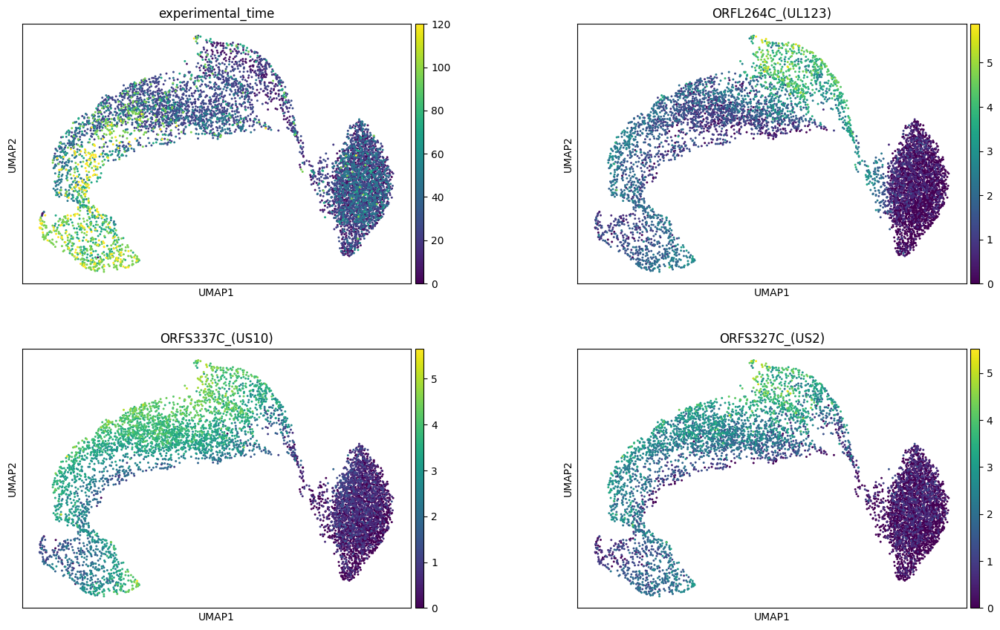

In [39]:
sc.pl.umap(adata_viral, color=["experimental_time", "ORFL264C_(UL123)", "ORFS337C_(US10)", "ORFS327C_(US2)"], ncols=2, wspace=0.3)

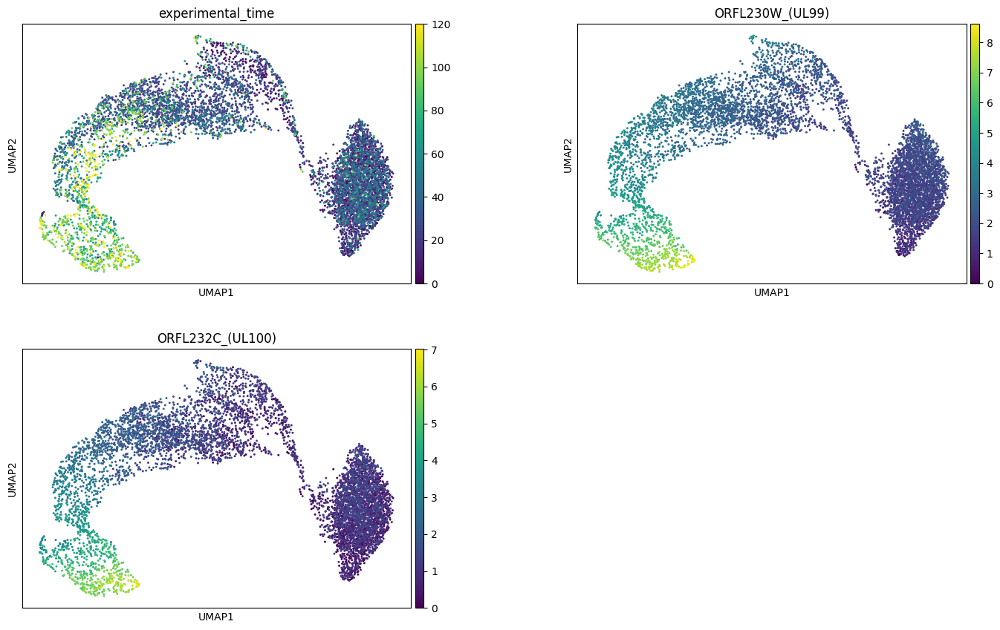

In [40]:
sc.pl.umap(adata_viral, color=["experimental_time", "ORFL230W_(UL99)", "ORFL232C_(UL100)"], ncols=2, wspace=0.3)

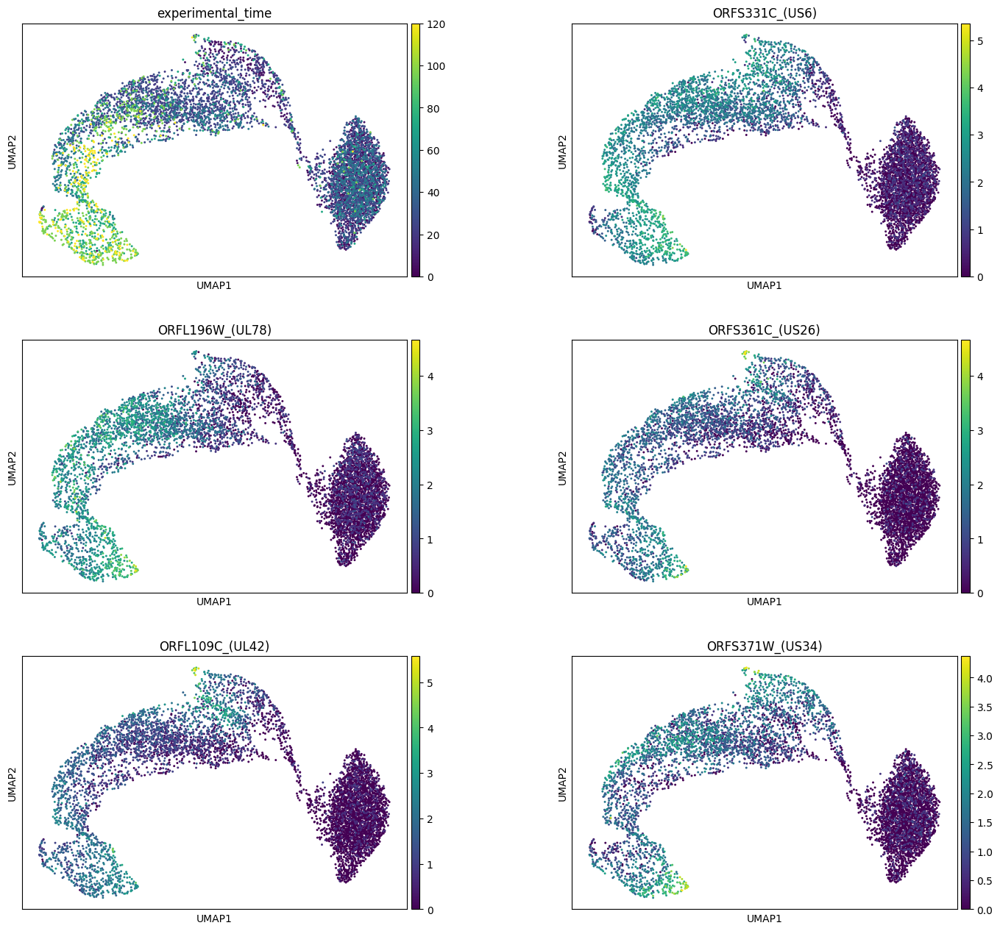

In [41]:
sc.pl.umap(adata_viral, color=["experimental_time", "ORFS331C_(US6)", "ORFL196W_(UL78)", "ORFS361C_(US26)", "ORFL109C_(UL42)", 
                              "ORFS371W_(US34)"], ncols=2, wspace=0.3)

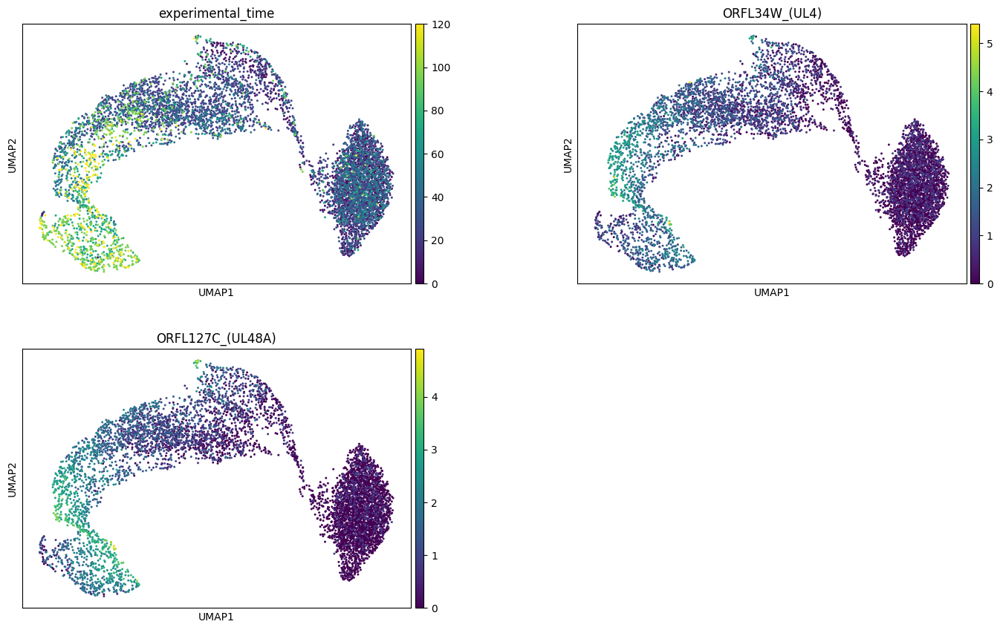

In [42]:
sc.pl.umap(adata_viral, color=["experimental_time", "ORFL34W_(UL4)", "ORFL127C_(UL48A)"], ncols=2, wspace=0.3)

Check if naive cells have viral reads

In [43]:
tot_counts_viral = np.array(adata_viral[adata_viral.obs["cluster"]=="naive"].X.sum(0)).squeeze()
tot_counts_viral = np.argsort(tot_counts_viral)
print("Lowly expressed genes")
print(adata_viral[adata_viral.obs["cluster"]=="naive"].var.iloc[tot_counts_viral][:10].index)
print("Highly expressed genes")
print(adata_viral[adata_viral.obs["cluster"]=="naive"].var.iloc[tot_counts_viral][-10:].index)

Lowly expressed genes
Index(['ORFL140C', 'ORFL147C', 'ORFL69W', 'ORFL52C', 'ORFL218C', 'ORFL185C',
       'ORFL294W', 'ORFL84C', 'ORFL227W', 'ORFL122C'],
      dtype='object', name='gene ID')
Highly expressed genes
Index(['ORFL300C_(UL141)', 'ORFL287C_(UL145)', 'RNA5.0', 'ORFL36W_(UL6)',
       'RNA4.9', 'ORFL105C_(UL40)', 'ORFL85C_(UL30)', 'RNA1.2',
       'ORFL57W_(UL22A)', 'RNA2.7'],
      dtype='object', name='gene ID')


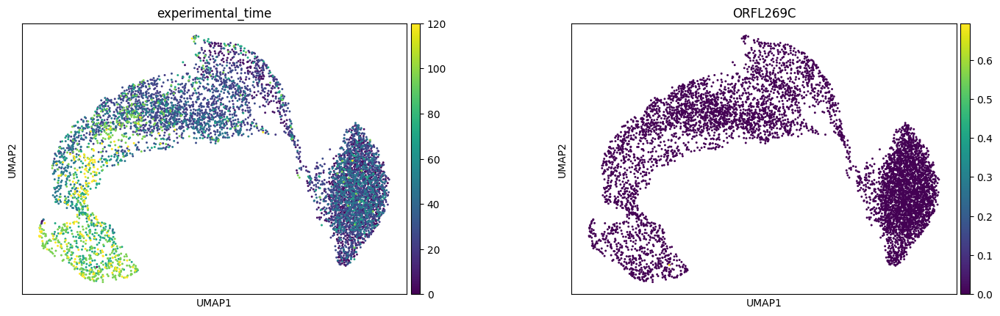

In [44]:
sc.pl.umap(adata_viral, color=["experimental_time", "ORFL269C"], ncols=2, wspace=0.3)

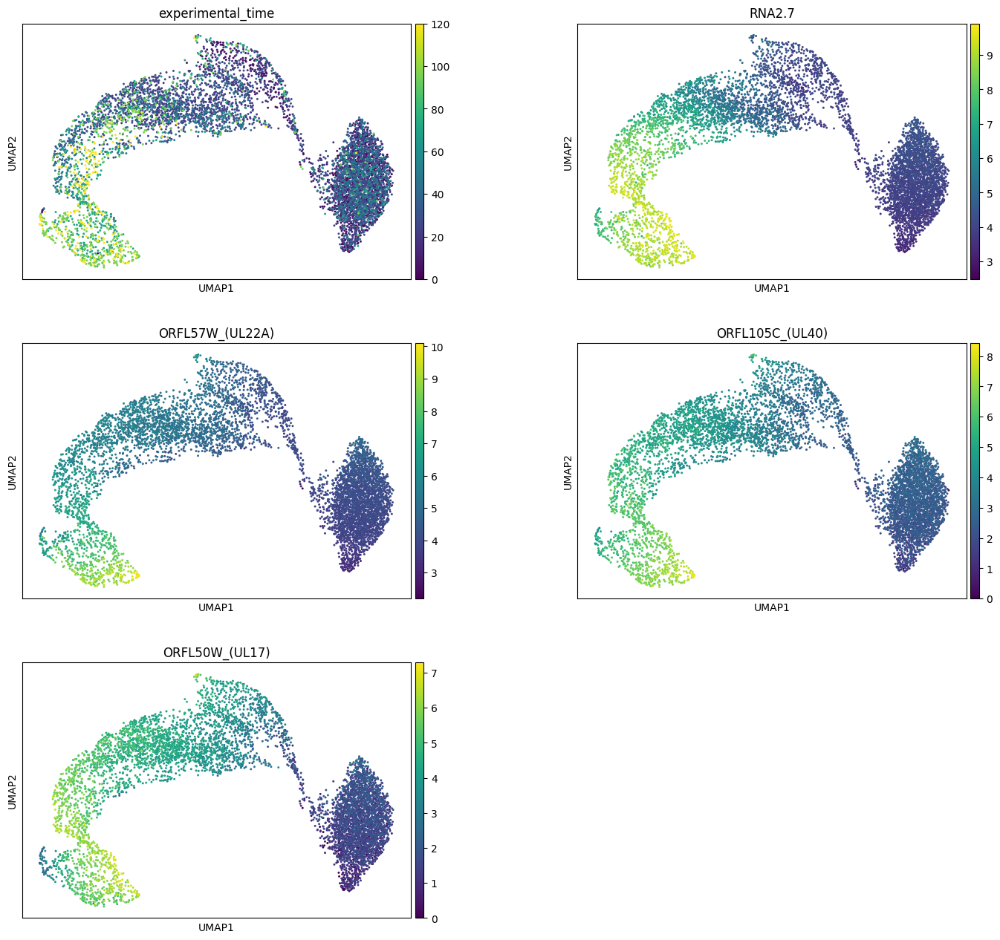

In [45]:
sc.pl.umap(adata_viral, color=["experimental_time", "RNA2.7", "ORFL57W_(UL22A)", "ORFL105C_(UL40)", "ORFL50W_(UL17)"], ncols=2, wspace=0.3)

In [46]:
def gene_vs_covariate(data, gene_name, covariate):
    print(data[:, gene_name].X.A)
    to_plot = pd.DataFrame({gene_name: data[:, gene_name].X.A.squeeze(),
                            covariate: data.obs[covariate]})
    sns.boxplot(to_plot, x=covariate, y=gene_name)

[[1.9459102]
 [1.7917595]
 [3.4011974]
 ...
 [0.6931472]
 [0.       ]
 [2.3025851]]


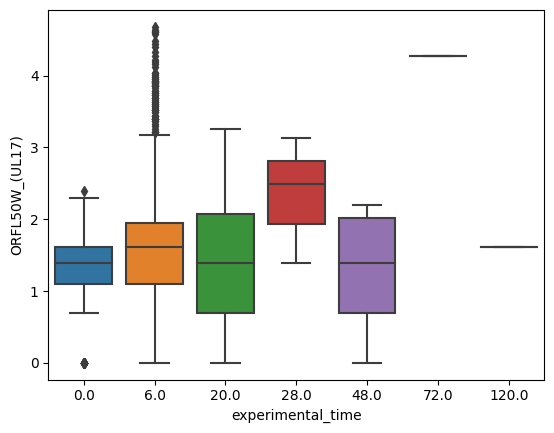

In [47]:
gene_vs_covariate(adata_viral[adata_viral.obs["cluster"]=="naive"], 
                  "ORFL50W_(UL17)", 
                  "experimental_time")

**Now consider the whole anndata**

In [48]:
adata.X = hstack((adata_host.X, adata_viral.X))

/nfs/homedirs/pala/miniconda3/envs/PerturbSeq_CMV/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/homedirs/pala/miniconda3/envs/PerturbSeq_CMV/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/homedirs/pala/miniconda3/envs/PerturbSeq_CMV/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


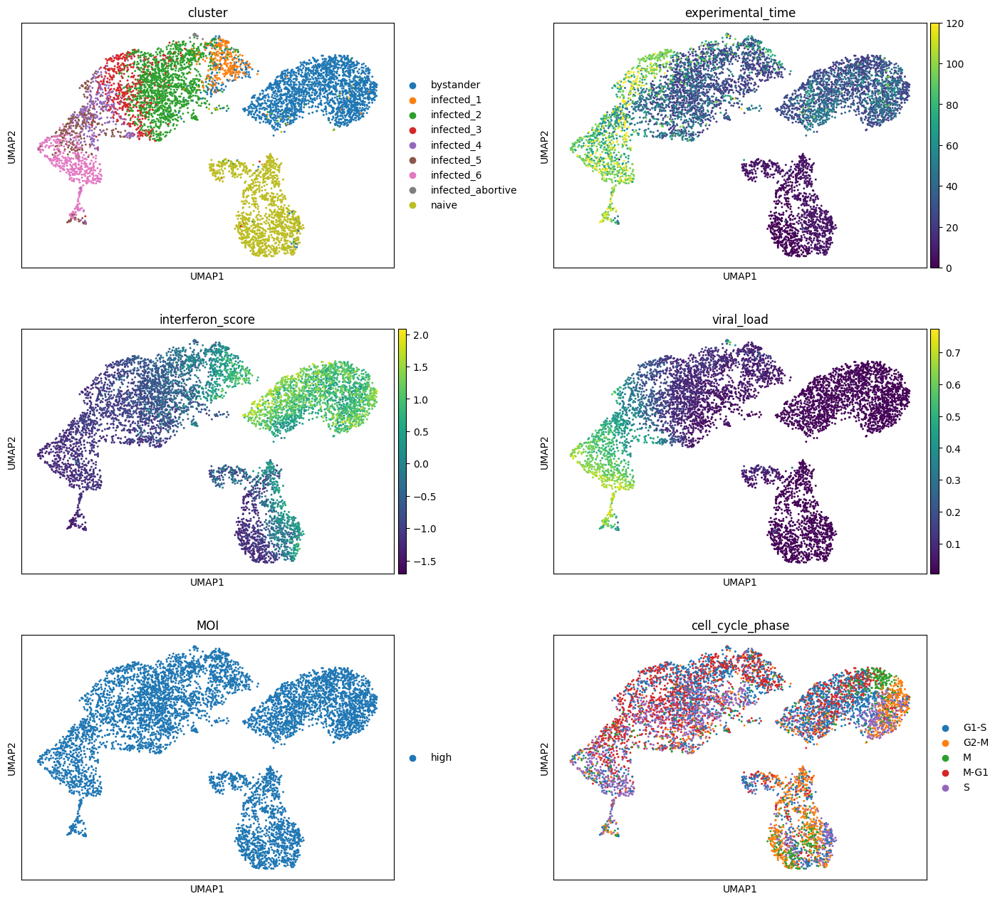

In [49]:
sc.tl.pca(adata, svd_solver="arpack", use_highly_variable=True)
sc.pp.neighbors(adata, n_pcs=30)
sc.tl.umap(adata)
sc.pl.umap(adata, color=["cluster", "experimental_time", "interferon_score", "viral_load", "MOI", "cell_cycle_phase"], ncols=2, wspace=0.3)

/nfs/homedirs/pala/miniconda3/envs/PerturbSeq_CMV/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


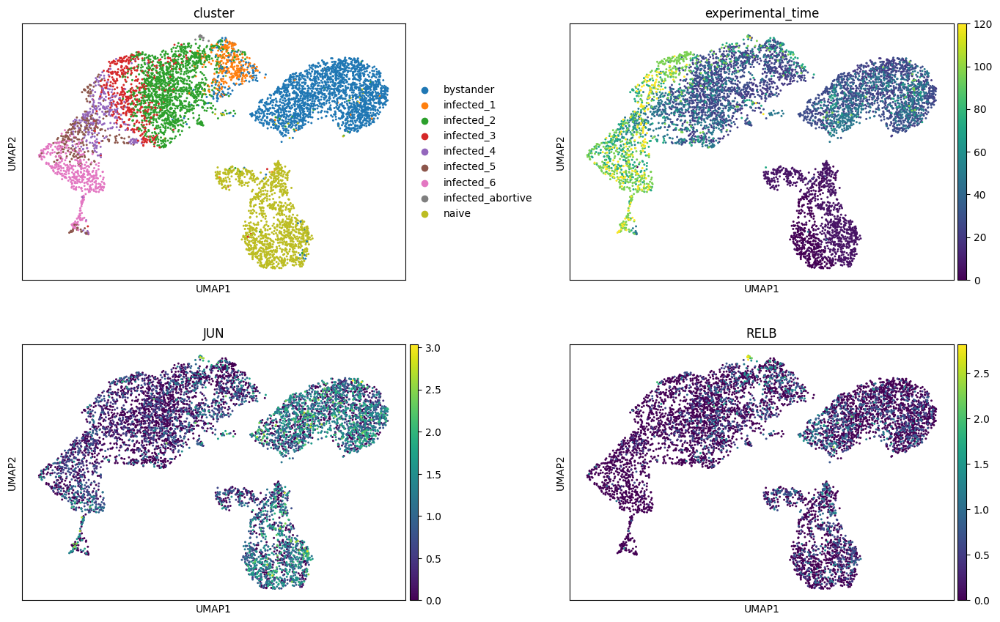

In [50]:
sc.pl.umap(adata, color=["cluster", "experimental_time", "JUN", "RELB"], ncols=2, wspace=0.3)

In [51]:
adata.obsm["X_host"] = adata_host.X
adata.obsm["X_viral"] = adata_viral.X

**Save the anndata**

In [52]:
processed_data_dir = DATA_DIR / "processed"

In [53]:
adata.write(processed_data_dir / "unperturbed_time_course.h5ad")
adata_viral.write(processed_data_dir / "unperturbed_time_course_viral.h5ad")
adata_host.write(processed_data_dir / "unperturbed_time_course_host.h5ad")